# Lecture Series II - Vocoder 

## load modules

In [17]:
import librosa
import IPython.display as ipd
import numpy as np 

In [18]:
from audioutil_librosa import get_wav_fromfile_librosa, load_wav_librosa , load_wav_librosa, depad_wav_librosa
from audioutil_librosa import norm_wav_librosa, save_wav_librosa, resample_wav_librosa
from audioutil_librosa import get_spec_stft_librosa, get_spec_stft_inv_librosa, get_magangle_librosa, get_magphase_inv_librosa
from audioutil_librosa import get_abssign_librosa, get_abssign_inv_librosa, get_zeroclip_librosa
from audioutil_librosa import get_mel_basis_half_librosa, get_mel_basis_full_librosa
from audioutil_librosa import get_window_librosa, get_lin2mel_librosa, get_mel2lin_librosa
from audioutil_librosa import get_drc_librosa, get_drc_inv_librosa, get_spec_strft_librosa, get_spec_strft_inv_librosa
from audioutil_librosa import get_spec_stdct_librosa, get_spec_stdct_inv_librosa

### load audio files

In [19]:
filename='LJ037-0171.wav'

In [20]:
ipd.display(ipd.Audio(filename))

## step1. load audio file with librosa

In [21]:
wav, sr, nsamples, dur = load_wav_librosa(filename, sr=22050, mono=True)

In [22]:
print( sr, nsamples, dur)

22050 167226 7.583945578231292


## Waveform

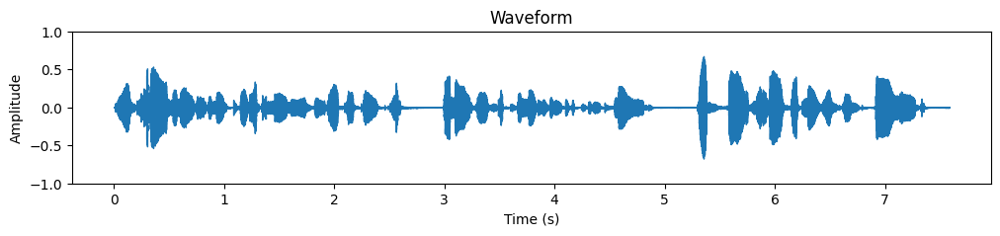

In [67]:
plt.figure(figsize=(12, 2))
librosa.display.waveshow(wav )
plt.ylim(-1,1)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

## spectrogram (STFT)

In [26]:
spectrogram = get_spec_stft_librosa(wav )

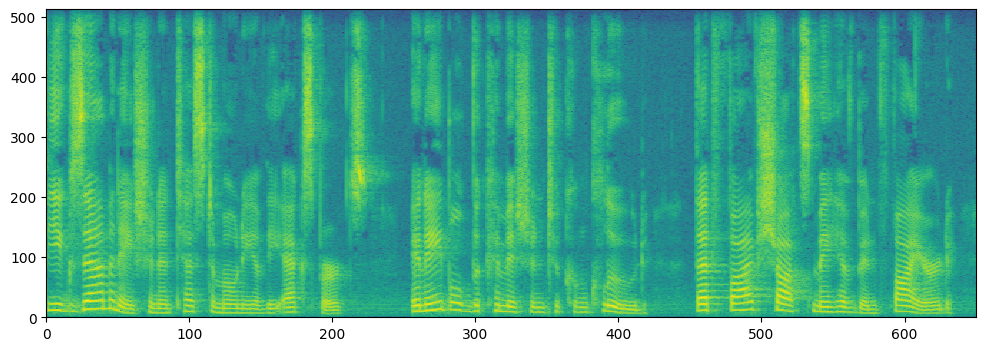

In [36]:
plt.figure(figsize=(12, 4))
plt.pcolormesh(np.log(np.abs(spectrogram)))

In [29]:
reconstructed_wav = get_spec_stft_inv_librosa(spectrogram )

In [30]:
ipd.display(ipd.Audio(reconstructed_wav, rate=22050))

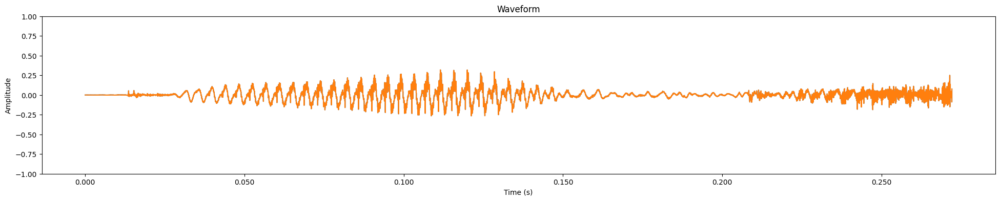

In [66]:
plt.figure(figsize=(24, 4))
librosa.display.waveshow(wav[:6000] )
librosa.display.waveshow(reconstructed_wav[:6000] )
plt.ylim(-1,1)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

In [37]:
magnitude, phase = get_magphase_librosa(spectrogram)

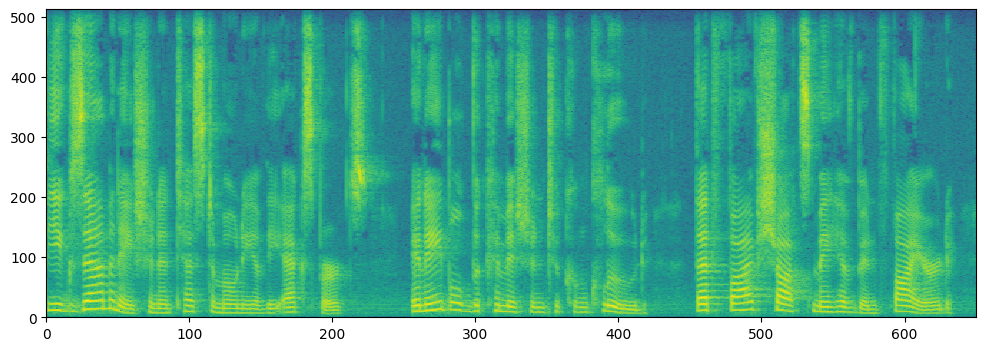

In [38]:
plt.figure(figsize=(12, 4))
plt.pcolormesh(np.log(np.abs(magnitude)))

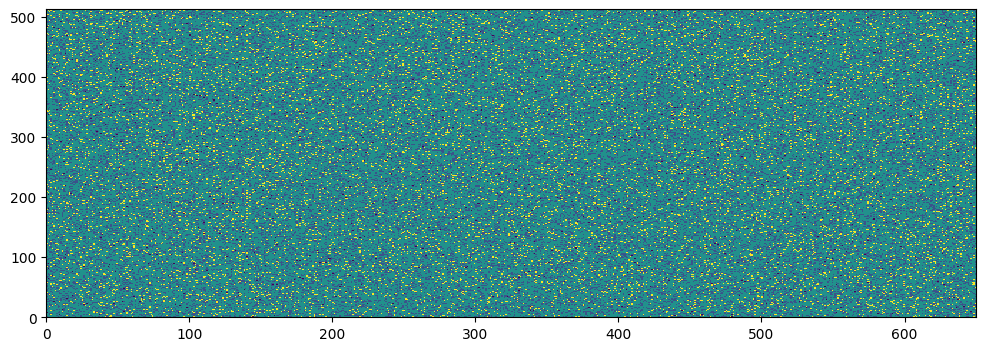

In [39]:
plt.figure(figsize=(12, 4))
plt.pcolormesh(np.log(np.abs(phase)))

# understand Spectrogram 

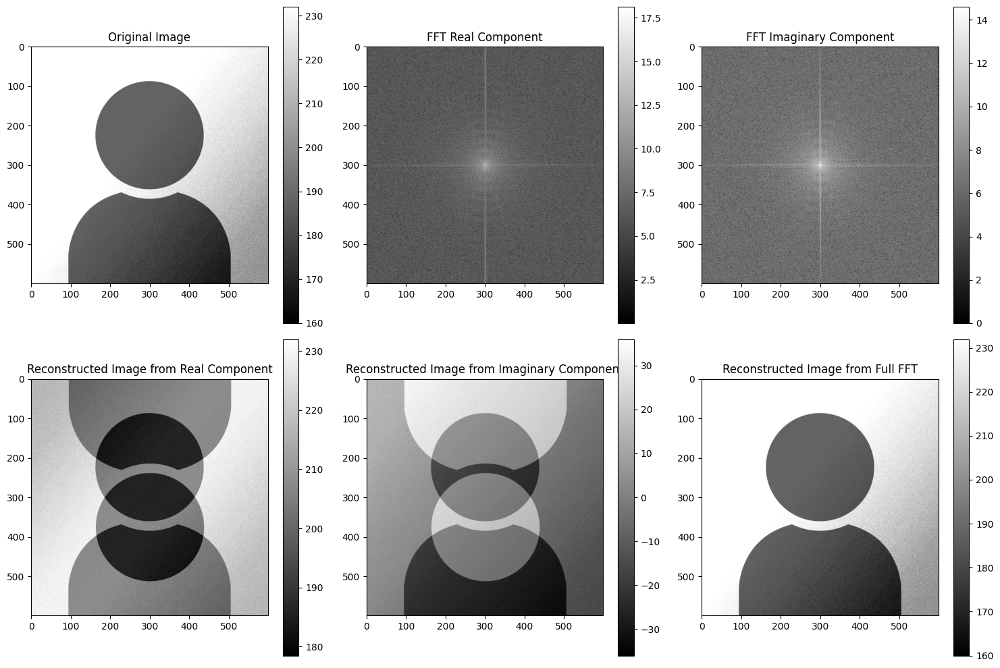

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft2, ifft2, fftshift, ifftshift
from PIL import Image
import requests
from io import BytesIO

# Step 1: Load an image
image_url = 'https://upload.wikimedia.org/wikipedia/commons/8/89/Portrait_Placeholder.png'  # Example image URL
response = requests.get(image_url)
image = Image.open(BytesIO(response.content))

# Step 2: Convert the image to grayscale
image_gray = image.convert('L')
image_gray_np = np.array(image_gray)

# Step 3: Apply FFT to the image
fft_image = fft2(image_gray_np)
fft_image_shifted = fftshift(fft_image)  # Shift zero frequency to the center

# Step 4: Extract real and imaginary components
real_component = np.real(fft_image_shifted)
imaginary_component = np.imag(fft_image_shifted)

# Step 5: Reconstruct image using only the real component
reconstructed_real_fft = real_component + 1j * np.zeros_like(imaginary_component)
reconstructed_real_image = np.real(ifft2(ifftshift(reconstructed_real_fft)))

# Step 6: Reconstruct image using only the imaginary component
reconstructed_imaginary_fft = np.zeros_like(real_component) + 1j * imaginary_component
reconstructed_imaginary_image = np.real(ifft2(ifftshift(reconstructed_imaginary_fft)))

# Step 7: Reconstruct image using both real and imaginary components
reconstructed_full_image = np.real(ifft2(ifftshift(fft_image_shifted)))

# Plotting the results
plt.figure(figsize=(15, 10))

# Original Image
plt.subplot(2, 3, 1)
plt.title('Original Image')
plt.imshow(image_gray_np, cmap='gray')
plt.colorbar()

# FFT Real Component
plt.subplot(2, 3, 2)
plt.title('FFT Real Component')
plt.imshow(np.log(np.abs(real_component) + 1), cmap='gray')
plt.colorbar()

# FFT Imaginary Component
plt.subplot(2, 3, 3)
plt.title('FFT Imaginary Component')
plt.imshow(np.log(np.abs(imaginary_component) + 1), cmap='gray')
plt.colorbar()

# Reconstructed Image from Real Component
plt.subplot(2, 3, 4)
plt.title('Reconstructed Image from Real Component')
plt.imshow(reconstructed_real_image, cmap='gray')
plt.colorbar()

# Reconstructed Image from Imaginary Component
plt.subplot(2, 3, 5)
plt.title('Reconstructed Image from Imaginary Component')
plt.imshow(reconstructed_imaginary_image, cmap='gray')
plt.colorbar()

# Reconstructed Image from Full FFT
plt.subplot(2, 3, 6)
plt.title('Reconstructed Image from Full FFT')
plt.imshow(reconstructed_full_image, cmap='gray')
plt.colorbar()

plt.tight_layout()
plt.show()


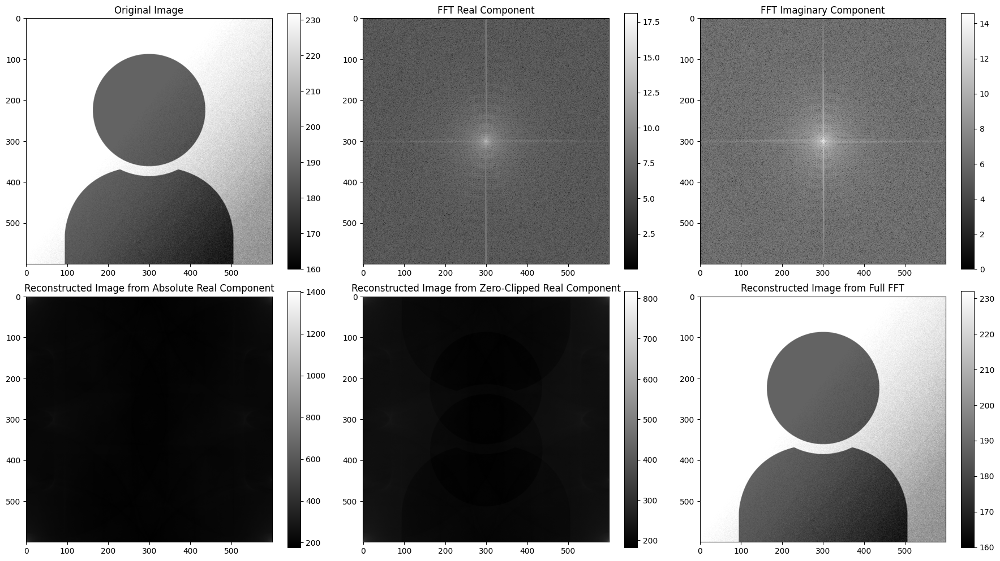

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft2, ifft2, fftshift, ifftshift
from PIL import Image
import requests
from io import BytesIO

# Step 1: Load an image
image_url = 'https://upload.wikimedia.org/wikipedia/commons/8/89/Portrait_Placeholder.png'  # Example image URL
response = requests.get(image_url)
image = Image.open(BytesIO(response.content))

# Step 2: Convert the image to grayscale
image_gray = image.convert('L')
image_gray_np = np.array(image_gray)

# Step 3: Apply FFT to the image
fft_image = fft2(image_gray_np)
fft_image_shifted = fftshift(fft_image)  # Shift zero frequency to the center

# Step 4: Extract real and imaginary components
real_component = np.real(fft_image_shifted)
imaginary_component = np.imag(fft_image_shifted)

# Step 5: Reconstruct image using the absolute value of the real part
abs_real_component = np.abs(real_component)
reconstructed_abs_real_fft = abs_real_component + 1j * np.zeros_like(imaginary_component)
reconstructed_abs_real_image = np.real(ifft2(ifftshift(reconstructed_abs_real_fft)))

# Step 6: Reconstruct image with zero-clipped real part (0 if negative)
zero_clipped_real_component = np.clip(real_component, a_min=0, a_max=None)
reconstructed_zero_clipped_real_fft = zero_clipped_real_component + 1j * np.zeros_like(imaginary_component)
reconstructed_zero_clipped_real_image = np.real(ifft2(ifftshift(reconstructed_zero_clipped_real_fft)))

# Step 7: Reconstruct image using both real and imaginary components
reconstructed_full_image = np.real(ifft2(ifftshift(fft_image_shifted)))

# Plotting the results
plt.figure(figsize=(18, 10))

# Original Image
plt.subplot(2, 3, 1)
plt.title('Original Image')
plt.imshow(image_gray_np, cmap='gray')
plt.colorbar()

# FFT Real Component
plt.subplot(2, 3, 2)
plt.title('FFT Real Component')
plt.imshow(np.log(np.abs(real_component) + 1), cmap='gray')
plt.colorbar()

# FFT Imaginary Component
plt.subplot(2, 3, 3)
plt.title('FFT Imaginary Component')
plt.imshow(np.log(np.abs(imaginary_component) + 1), cmap='gray')
plt.colorbar()

# Reconstructed Image from Absolute Real Component
plt.subplot(2, 3, 4)
plt.title('Reconstructed Image from Absolute Real Component')
plt.imshow(reconstructed_abs_real_image, cmap='gray')
plt.colorbar()

# Reconstructed Image from Zero-Clipped Real Component
plt.subplot(2, 3, 5)
plt.title('Reconstructed Image from Zero-Clipped Real Component')
plt.imshow(reconstructed_zero_clipped_real_image, cmap='gray')
plt.colorbar()

# Reconstructed Image from Full FFT
plt.subplot(2, 3, 6)
plt.title('Reconstructed Image from Full FFT')
plt.imshow(reconstructed_full_image, cmap='gray')
plt.colorbar()

plt.tight_layout()
plt.show()


## reconstruct wave with mag/phase

In [49]:
spectrogram_reconstructed = get_magphase_inv_librosa(magnitude, phase)

In [50]:
reconstructed_wav_magphase = get_spec_stft_inv_librosa(spectrogram_reconstructed )

In [51]:
ipd.display(ipd.Audio(reconstructed_wav_magphase, rate=22050))

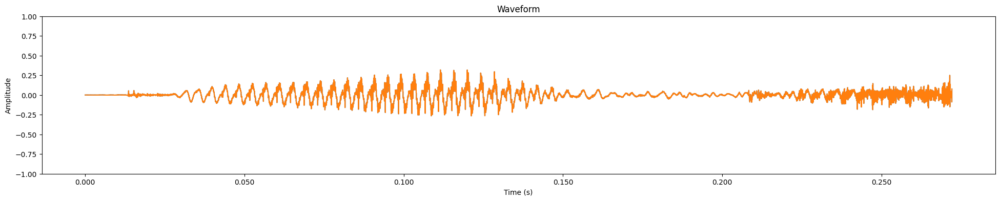

In [65]:
plt.figure(figsize=(24, 4))
librosa.display.waveshow(wav[:6000] )
librosa.display.waveshow(reconstructed_wav_magphase[:6000] )
plt.ylim(-1,1)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

In [122]:
phase_zero = np.ones_like(phase)
spectrogram_reconstructed_zerophase = get_magphase_inv_librosa(magnitude, phase_zero)
reconstructed_wav_magzerophase = get_spec_stft_inv_librosa(spectrogram_reconstructed_zerophase )
ipd.display(ipd.Audio(reconstructed_wav_magzerophase[50:-50], rate=22050 ))

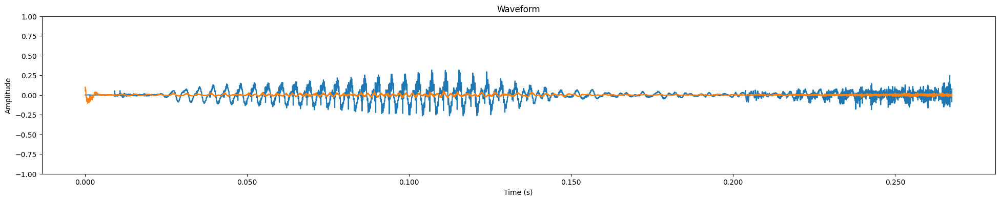

In [97]:
plt.figure(figsize=(24, 4))
librosa.display.waveshow(wav[100:6000] )
librosa.display.waveshow(reconstructed_wav_magzerophase[100:6000] )
plt.ylim(-1,1)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

In [77]:
phase_rand = np.random.random(phase.shape) * 1j
spectrogram_reconstructed_phaserand = get_magphase_inv_librosa(magnitude, phase_rand)

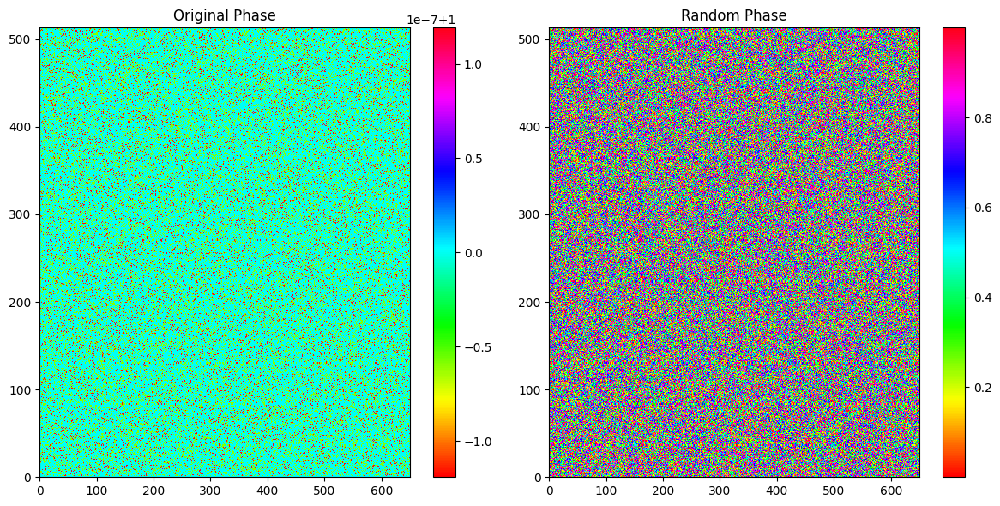

In [83]:
# Plotting the results
plt.figure(figsize=(12, 6))

# Original Phase
plt.subplot(1, 2, 1)
plt.title('Original Phase')
plt.pcolormesh(np.abs(phase), cmap='hsv')
plt.colorbar()

# Random Phase
plt.subplot(1, 2, 2)
plt.title('Random Phase')
plt.pcolormesh(np.abs(phase_rand), cmap='hsv')
plt.colorbar()

plt.tight_layout()
plt.show()

In [78]:
reconstructed_wav_phaserand = get_spec_stft_inv_librosa(spectrogram_reconstructed_zerophase )

In [93]:
ipd.display(ipd.Audio(reconstructed_wav_phaserand[50:-50], rate=22050 ))

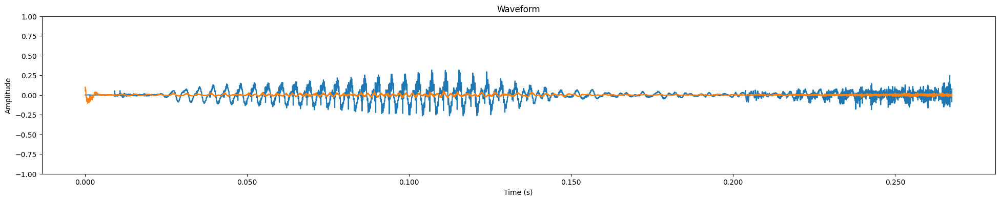

In [98]:
plt.figure(figsize=(24, 4))
librosa.display.waveshow(wav[100:6000] )
librosa.display.waveshow(reconstructed_wav_phaserand[100:6000] )
plt.ylim(-1,1)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Griffin-Lim Algorithm
[theory](https://paperswithcode.com/method/griffin-lim-algorithm)

![](https://production-media.paperswithcode.com/methods/Screen_Shot_2020-07-05_at_5.38.51_PM_NWlcdyB.png)

In [85]:
def get_griffin_lim(magnitude, n_iter=32, n_fft=1024, hop_length=256):
    # Initialize the phase with random values
    phase = np.exp(1j * np.random.randn(*magnitude.shape))
    spectrogram = magnitude * phase
    for i in range(n_iter):
        wav_recon = librosa.istft(spectrogram, hop_length=hop_length)
        spectrogram = librosa.stft(wav_recon, n_fft=n_fft, hop_length=hop_length)
        spectrogram = magnitude * np.exp(1j * np.angle(spectrogram))
    phase_recon = np.angle(spectrogram)
    return magnitude, phase_recon

In [87]:
magnitude, phase_iter_10 = get_griffin_lim(magnitude, n_iter=10)
spectrogram_reconstructed_phase_iter_10 = get_magphase_inv_librosa(magnitude, phase_iter_10)
reconstructed_wav__phase_iter_10 = get_spec_stft_inv_librosa(spectrogram_reconstructed_phase_iter_10 )

In [107]:
ipd.display(ipd.Audio(wav[100:-100], rate=22050 ))
ipd.display(ipd.Audio(reconstructed_wav__phase_iter_10[100:-100], rate=22050 ))

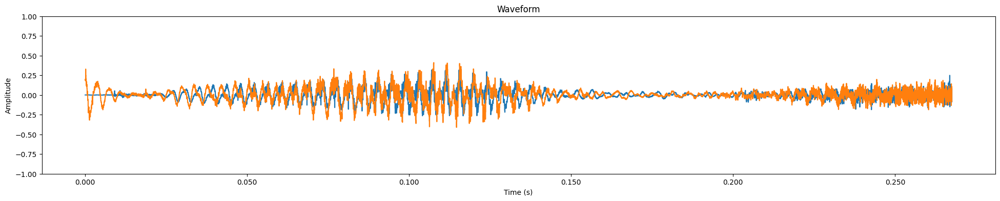

In [100]:
plt.figure(figsize=(24, 4))
librosa.display.waveshow(wav[100:6000] )
librosa.display.waveshow(reconstructed_wav__phase_iter_10[100:6000] )
plt.ylim(-1,1)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

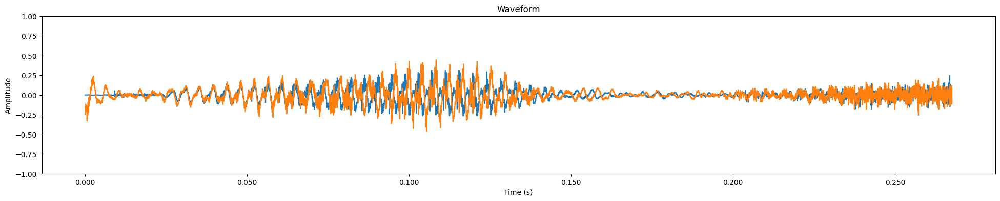

In [106]:
magnitude, phase_iter_20 = get_griffin_lim(magnitude, n_iter=20)
spectrogram_reconstructed_phase_iter_20 = get_magphase_inv_librosa(magnitude, phase_iter_20)
reconstructed_wav__phase_iter_20 = get_spec_stft_inv_librosa(spectrogram_reconstructed_phase_iter_20 )
plt.figure(figsize=(24, 4))
librosa.display.waveshow(wav[100:6000] )
librosa.display.waveshow(reconstructed_wav__phase_iter_20[100:6000] )
plt.ylim(-1,1)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()
ipd.display(ipd.Audio(wav[100:-100], rate=22050 ))
ipd.display(ipd.Audio(reconstructed_wav__phase_iter_20[100:-100], rate=22050 ))

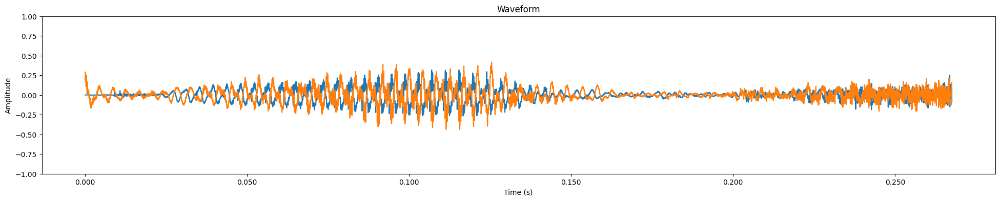

In [105]:
magnitude, phase_iter_60 = get_griffin_lim(magnitude, n_iter=60)
spectrogram_reconstructed_phase_iter_60 = get_magphase_inv_librosa(magnitude, phase_iter_60)
reconstructed_wav__phase_iter_60 = get_spec_stft_inv_librosa(spectrogram_reconstructed_phase_iter_60 )
plt.figure(figsize=(24, 4))
librosa.display.waveshow(wav[100:6000] )
librosa.display.waveshow(reconstructed_wav__phase_iter_60[100:6000] )
plt.ylim(-1,1)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()
ipd.display(ipd.Audio(wav[100:-100], rate=22050 ))
ipd.display(ipd.Audio(reconstructed_wav__phase_iter_60[100:-100], rate=22050 ))

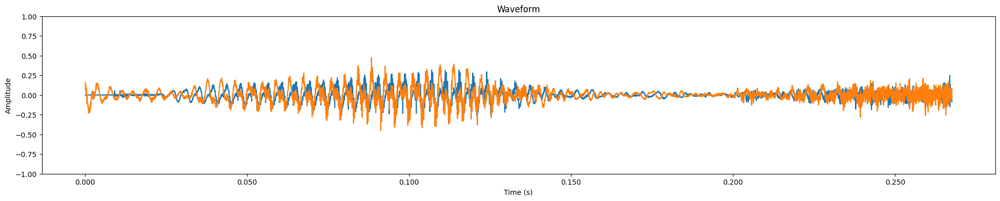

In [108]:
magnitude, phase_iter_120 = get_griffin_lim(magnitude, n_iter=120)
spectrogram_reconstructed_phase_iter_120 = get_magphase_inv_librosa(magnitude, phase_iter_120)
reconstructed_wav__phase_iter_120 = get_spec_stft_inv_librosa(spectrogram_reconstructed_phase_iter_120 )
plt.figure(figsize=(24, 4))
librosa.display.waveshow(wav[100:6000] )
librosa.display.waveshow(reconstructed_wav__phase_iter_120[100:6000] )
plt.ylim(-1,1)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()
ipd.display(ipd.Audio(wav[100:-100], rate=22050 ))
ipd.display(ipd.Audio(reconstructed_wav__phase_iter_120[100:-100], rate=22050 ))

# compress/decompress [dynamic range]

In [109]:
import numpy as np
import librosa

def dynamic_range_compression(x, C=1, clip_val=1e-5):
    return np.log(np.clip(x, clip_val, None) * C)

def dynamic_range_decompression(x, C=1):
    return np.exp(x) / C

def compress_magnitude(magnitude, ref_value=1.0):
    return librosa.amplitude_to_db(magnitude, ref=ref_value)

def decompress_magnitude(log_magnitude):
    return librosa.db_to_amplitude(log_magnitude)

In [123]:
magnitude, phase = get_magphase_librosa(spectrogram)

compressed_magnitude = dynamic_range_compression(magnitude)
decompressed_magnitude_clip = dynamic_range_decompression(compressed_magnitude)

log_magnitude = compress_magnitude(magnitude)
decompressed_magnitude_log = decompress_magnitude(log_magnitude)

6.019443e-07 63.64943


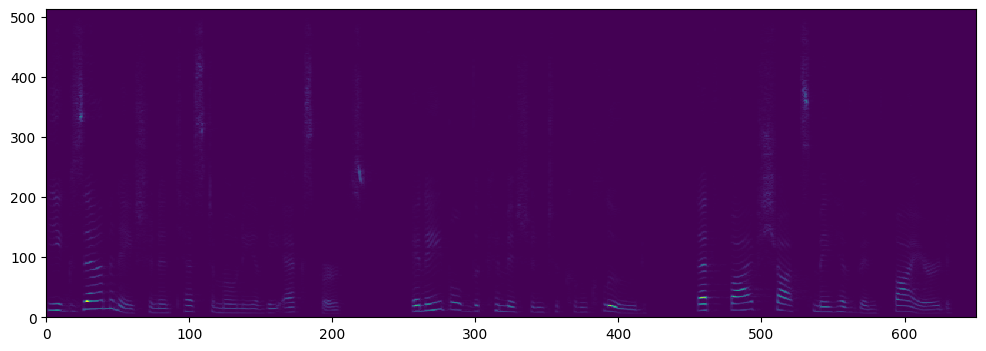

In [120]:
print(np.min(magnitude), np.max(magnitude) ) 
plt.figure(figsize=(12,4))
plt.pcolormesh(magnitude)

-11.512925 4.1533904


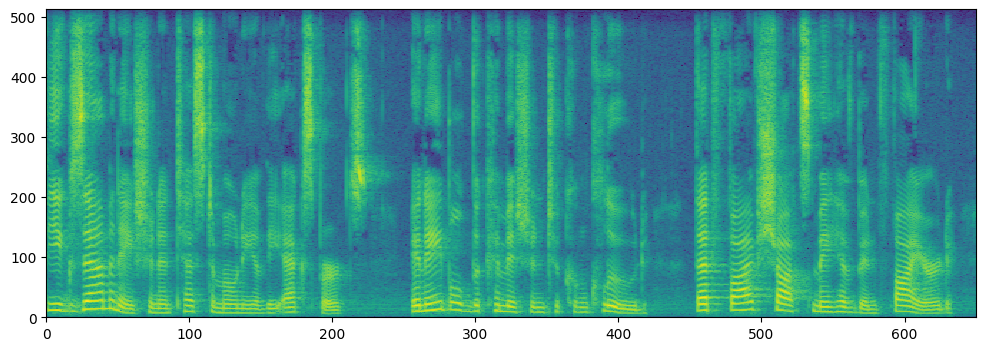

In [119]:
print(np.min(compressed_magnitude), np.max(compressed_magnitude) ) 
plt.figure(figsize=(12,4))
plt.pcolormesh(compressed_magnitude)


-43.92411 36.07589


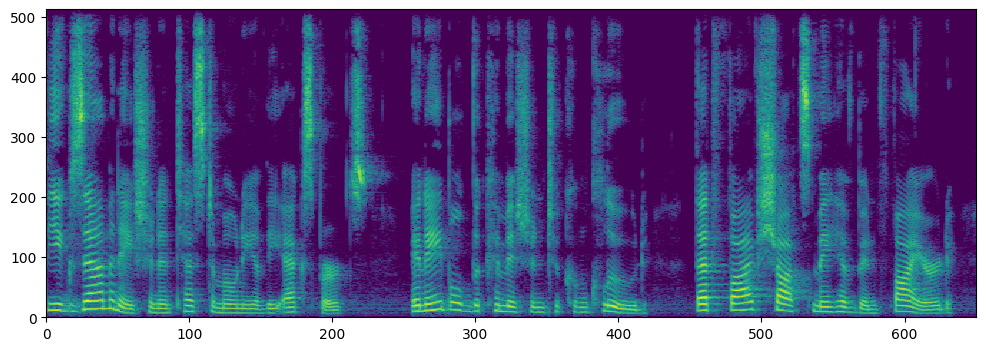

In [121]:
print(np.min(log_magnitude), np.max(log_magnitude) ) 
plt.figure(figsize=(12,4))
plt.pcolormesh(log_magnitude)

In [126]:
spectrogram_reconstructed_magnitude_clip = get_magphase_inv_librosa(decompressed_magnitude_clip, phase)
reconstructed_wav_magnitude_clip = get_spec_stft_inv_librosa(spectrogram_reconstructed_magnitude_clip )
ipd.display(ipd.Audio(wav[50:-50], rate=22050 ))
ipd.display(ipd.Audio(reconstructed_wav_magnitude_clip[50:-50], rate=22050 ))

In [127]:
spectrogram_reconstructed_magnitude_log = get_magphase_inv_librosa(decompressed_magnitude_log, phase)
reconstructed_wav_magnitude_log  = get_spec_stft_inv_librosa(spectrogram_reconstructed_magnitude_log )
ipd.display(ipd.Audio(wav[50:-50], rate=22050 ))
ipd.display(ipd.Audio(reconstructed_wav_magnitude_log[50:-50], rate=22050 ))

## mu-law quantization [waveform]

In [159]:
import numpy as np
import librosa
import soundfile as sf
import matplotlib.pyplot as plt

# Function to perform mu-law encoding
def mu_law_encode(audio, mu=128):
    """Encode audio signal using mu-law."""
    audio = np.clip(audio, -1, 1)
    encoded = np.sign(audio) * np.log1p(mu * np.abs(audio)) / np.log1p(mu)
    return encoded

# Function to perform mu-law decoding
def mu_law_decode(encoded, mu=128):
    """Decode mu-law encoded signal."""
    decoded = np.sign(encoded) * (1 / mu) * ((1 + mu) ** np.abs(encoded) - 1)
    return decoded


In [160]:

# Perform mu-law encoding
encoded_audio = mu_law_encode(wav)

# Perform mu-law decoding
decoded_audio = mu_law_decode(encoded_audio)


In [161]:
print(np.min(wav), np.max(wav) ) 
print(np.min(encoded_audio), np.max(encoded_audio) ) 
print(np.min(decoded_audio), np.max(decoded_audio) ) 

-0.6732178 0.6492615
-0.9193527 0.91198415
-0.6732178 0.64926165


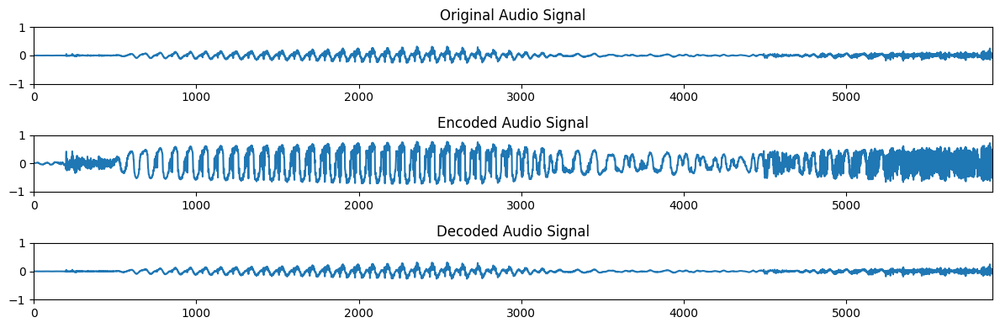

In [162]:

# Plot the original and decoded audio signals
plt.figure(figsize=(12, 4))

plt.subplot(3, 1, 1)
plt.title('Original Audio Signal')
plt.plot(wav[100:6000])
plt.ylim(-1,1)
plt.xlim([0, len(wav[100:6000])])


plt.subplot(3, 1, 2)
plt.title('Encoded Audio Signal')
plt.plot(encoded_audio[100:6000])
plt.ylim(-1,1)
plt.xlim([0, len(encoded_audio[100:6000])])

plt.subplot(3, 1, 3)
plt.title('Decoded Audio Signal')
plt.plot(decoded_audio[100:6000])
plt.ylim(-1,1)
plt.xlim([0, len(decoded_audio[100:6000])])

plt.tight_layout()
plt.show()


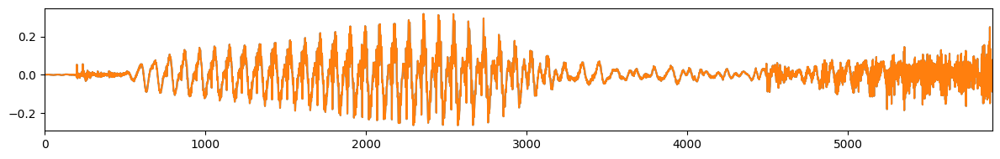

In [163]:

# Perform mu-law encoding
encoded_audio = mu_law_encode(wav)

# Perform mu-law decoding
decoded_audio = mu_law_decode(encoded_audio)

# Plot the original and decoded audio signals
plt.figure(figsize=(12, 2))
plt.plot(wav[100:6000])

plt.plot(decoded_audio[100:6000])
plt.xlim([0, len(decoded_audio[100:6000])])

plt.tight_layout()
plt.show()


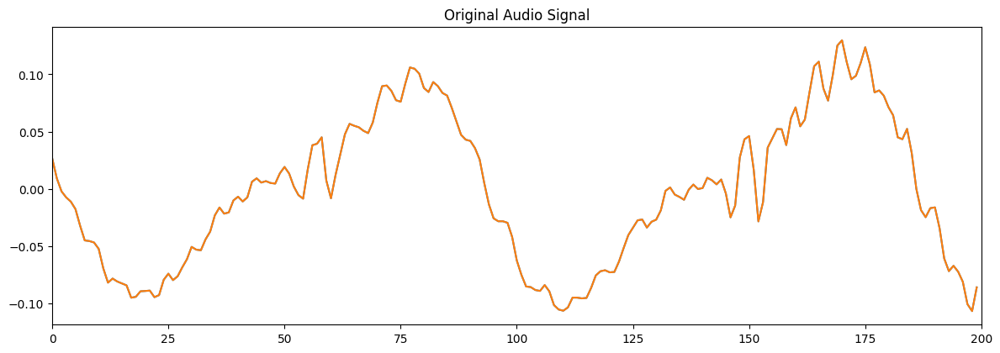

In [164]:

# Perform mu-law encoding
encoded_audio = mu_law_encode(wav)

# Perform mu-law decoding
decoded_audio = mu_law_decode(encoded_audio)

# Plot the original and decoded audio signals
plt.figure(figsize=(12, 8))

plt.subplot(2, 1, 1)
plt.title('Original Audio Signal')
plt.plot(wav[800:1000])
plt.plot(decoded_audio[800:1000])
plt.xlim([0, len(decoded_audio[800:1000])])

plt.tight_layout()
plt.show()


In [165]:
ipd.display(ipd.Audio(wav[50:-50], rate=22050 ))
ipd.display(ipd.Audio(decoded_audio[50:-50], rate=22050 ))

# mel scale 

In [166]:
mel_basis = get_mel_basis_half_librosa()

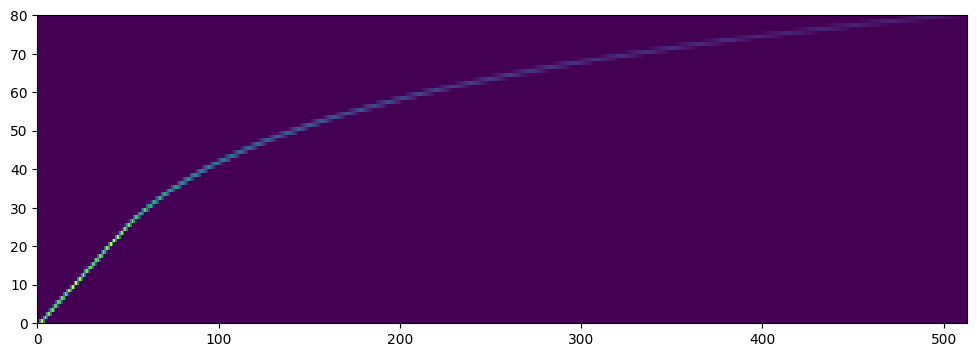

In [181]:
plt.figure(figsize=(12,4))
plt.pcolormesh(mel_basis, color)

In [171]:
mel_spectrogram = get_lin2mel_librosa(magnitude, mel_basis =mel_basis )

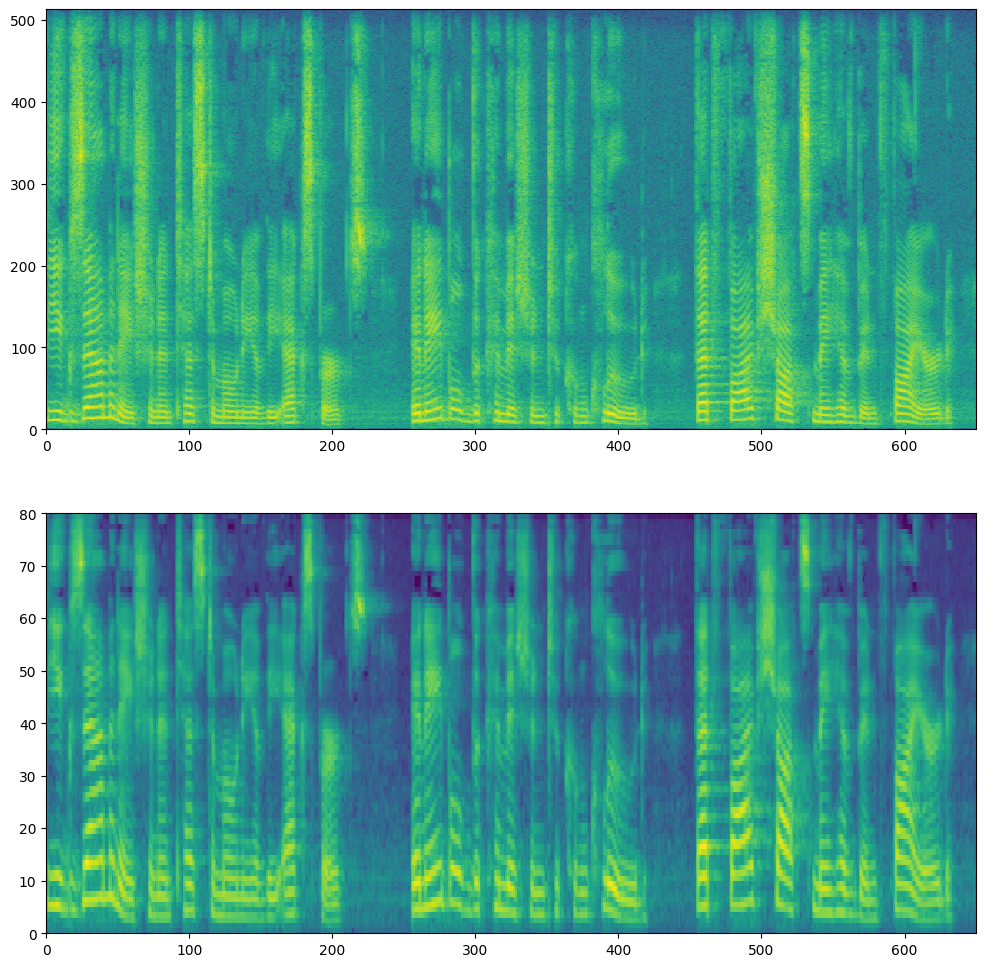

In [180]:

plt.figure(figsize=(12,12))
plt.subplot(2, 1, 1)
plt.pcolormesh(np.log(magnitude))
plt.subplot(2, 1, 2)
plt.pcolormesh(np.log(mel_spectrogram))

In [182]:
mag_recon_mel=get_mel2lin_librosa(mel_spectrogram, mel_basis_T=mel_basis.T)

/tmp/ipykernel_3754/2261836603.py:5: RuntimeWarning: divide by zero encountered in log
  plt.pcolormesh(np.log(mag_recon_mel))


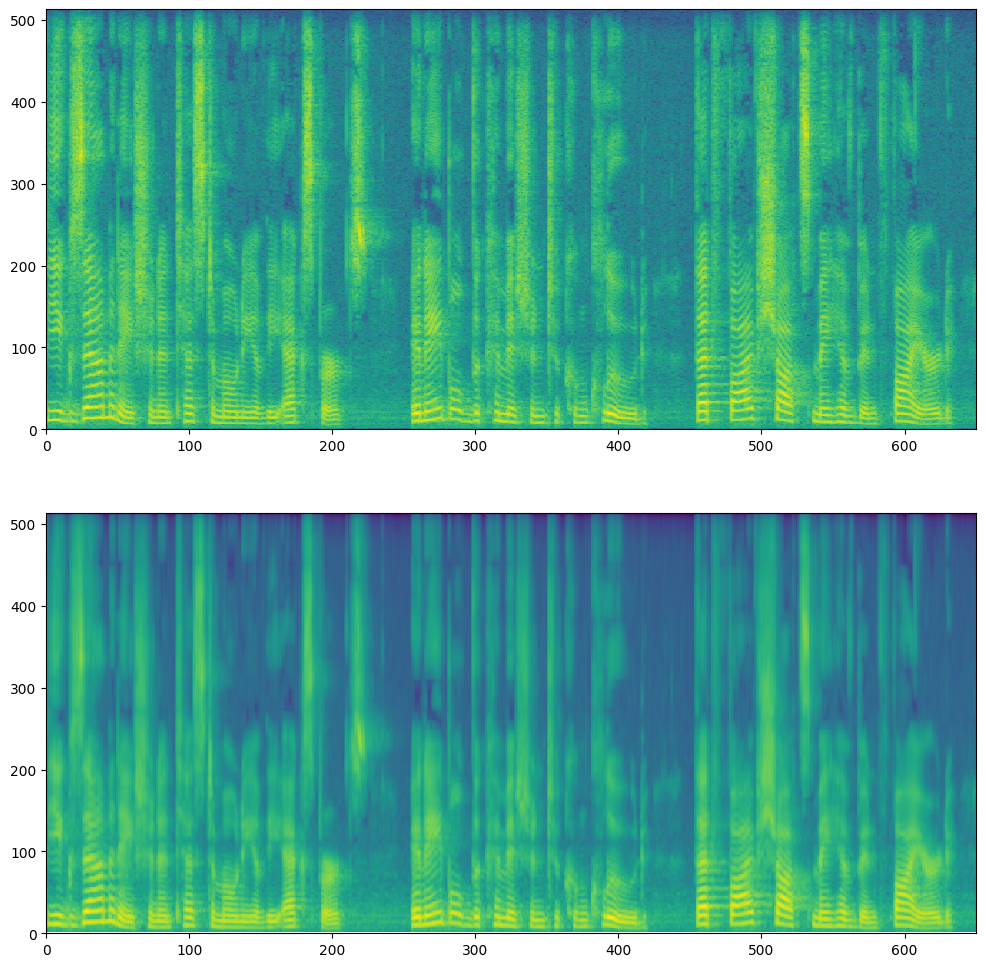

In [183]:

plt.figure(figsize=(12,12))
plt.subplot(2, 1, 1)
plt.pcolormesh(np.log(magnitude))
plt.subplot(2, 1, 2)
plt.pcolormesh(np.log(mag_recon_mel))

In [184]:
spectrogram_reconstructed_magnitude_mel = get_magphase_inv_librosa(mag_recon_mel, phase)
reconstructed_wav_magnitude_mel = get_spec_stft_inv_librosa(spectrogram_reconstructed_magnitude_mel )
ipd.display(ipd.Audio(wav[50:-50], rate=22050 ))
ipd.display(ipd.Audio(reconstructed_wav_magnitude_mel[50:-50], rate=22050 ))

-0.6732178 0.6492615
-0.00041911143 0.19732812


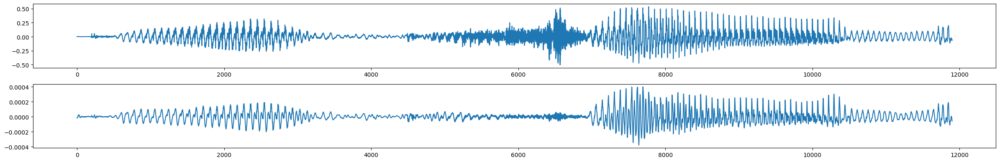

In [192]:
print(np.min(wav), np.max(wav) ) 
print(np.min(reconstructed_wav_magnitude_mel), np.max(reconstructed_wav_magnitude_mel) ) 
# Plot the original and decoded audio signals
plt.figure(figsize=(24, 4))
plt.subplot(2, 1, 1)
plt.plot(wav[100:12000])
plt.tight_layout()
 
plt.subplot(2, 1, 2)
plt.plot(reconstructed_wav_magnitude_mel[100:12000])

plt.tight_layout()
plt.show()


## Griffin Lim from Mel spectrogram

In [196]:
_ , phase_iter_120 = get_griffin_lim(mag_recon_mel, n_iter=120)
spectrogram_reconstructed_mel_phase_iter_120 = get_magphase_inv_librosa(mag_recon_mel, phase_iter_120)
reconstructed_wav_mel_phase_iter_120 = get_spec_stft_inv_librosa(spectrogram_reconstructed_mel_phase_iter_120 )

-0.6732178 0.6492615
-0.00041911143 0.19732812


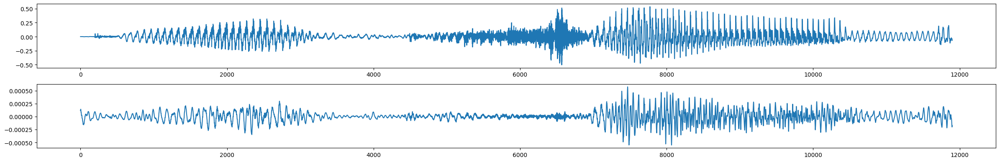

In [197]:
print(np.min(wav), np.max(wav) ) 
print(np.min(reconstructed_wav_magnitude_mel), np.max(reconstructed_wav_magnitude_mel) ) 
# Plot the original and decoded audio signals
plt.figure(figsize=(24, 4))
plt.subplot(2, 1, 1)
plt.plot(wav[100:12000])
plt.tight_layout()
 
plt.subplot(2, 1, 2)
plt.plot(reconstructed_wav_mel_phase_iter_120[100:12000])

plt.tight_layout()
plt.show()


In [198]:
ipd.display(ipd.Audio(wav[50:-50], rate=22050 ))
ipd.display(ipd.Audio(reconstructed_wav_magnitude_mel[50:-50], rate=22050 ))
ipd.display(ipd.Audio(reconstructed_wav_mel_phase_iter_120[50:-50], rate=22050 ))

# Vocoder 
## algorithm :  reconstruct waveform from mel spectrogram
- GLA[Griffin-Lim Algorithm]
- MVA [https://arxiv.org/abs/2106.03167](https://arxiv.org/abs/2106.03167)  [blog official](https://its10041004.github.io/MVA/)
  
## neural vocoder : reconstruct waveform from mel spectrogram with AI(neural network)
- **Google WaveNet** [https://arxiv.org/abs/1609.03499](https://arxiv.org/abs/1609.03499) [code unofficial](https://github.com/NVIDIA/nv-wavenet)
- **NVIDIA WaveGlow** [https://arxiv.org/abs/1811.00002](https://arxiv.org/abs/1811.00002) [code official](https://github.com/NVIDIA/waveglow)
- **Deepmind's WaveRNN** [https://arxiv.org/abs/1802.08435](https://arxiv.org/abs/1802.08435) [code unofficial](https://github.com/fatchord/WaveRNN)
- **Parallel WaveGAN** [https://arxiv.org/abs/1910.11480](https://arxiv.org/abs/1910.11480) [code unofficial](https://github.com/kan-bayashi/ParallelWaveGAN)
- **MelGAN** [https://arxiv.org/abs/1910.06711](https://arxiv.org/abs/1910.06711) [code official](https://github.com/descriptinc/melgan-neurips)
- **Kakao brain HiFi-GAN** [https://arxiv.org/abs/2010.05646](https://arxiv.org/abs/2010.05646) [code official](https://github.com/jik876/hifi-gan)
- **Multi-band MelGAN** [https://arxiv.org/abs/2005.05106](https://arxiv.org/abs/2005.05106) [code unofficial](https://github.com/kan-bayashi/ParallelWaveGAN)
- **Google LPCNet** [https://arxiv.org/abs/1810.11846](https://arxiv.org/abs/1810.11846) [code unofficial](https://github.com/mozilla/LPCNet)
- **StyleMelGAN** [https://arxiv.org/abs/2010.14674](https://arxiv.org/abs/2010.14674) [blog official](https://fhgspco.github.io/smgan/)
- **DiffWave**  [https://arxiv.org/pdf/2009.09761](https://arxiv.org/pdf/2009.09761) [code official](https://github.com/lmnt-com/diffwave)
- **NVIDIA/SNU bigvgan** [https://arxiv.org/abs/2206.04658](https://arxiv.org/abs/2206.04658) [code official](https://github.com/NVIDIA/BigVGAN)
- **Sony bigsgan** [https://arxiv.org/abs/2309.02836](https://arxiv.org/abs/2309.02836) [code official](https://github.com/sony/bigvsan)
